# Quantum Gate Syntesis - CNOT

Martin F.X. Mauser
2023-01-22

In [1]:
# disable GPU due to memory constraints alternativlely use TF-LMS from IBM
#import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
from QGS import *

import numpy as np
import strawberryfields as sf
from strawberryfields.ops import Ket, BSgate, Rgate, Interferometer, MZgate
from strawberryfields.utils import operation

Num GPUs Available:  1


In [2]:
# Definition BS
#
# BSgate(theta, phi) = exp(theta (e^(i phi) a_1 a_2^dagger - e^(-i phi) a_1^dagger a_2))


# Defintion Rotation
#
# Rgate(theat) = exp(i theta a^dagger a)


# Permutation matrix
PBS = np.array([[0, 1], [1, 0]])

## Ralph et al. 2002


1. Input:

The norm of the ket is  0.99999994

The nonzero components are:
(0.333+0j) (0, 1, 0, 0, 0, 1)
(0.333+0j) (0, 1, 0, 1, 0, 0)
(0.333+0j) (0, 1, 1, 0, 0, 0)
(-0.471-0j) (1, 0, 0, 0, 0, 1)
(-0.471-0j) (1, 0, 0, 1, 0, 0)
(-0.471-0j) (1, 0, 1, 0, 0, 0)

Target state: (0, 1, 0, 1, 0, 0)
The overall propability to get the target state is 0.110889

2. Input:

The norm of the ket is  0.99999994

The nonzero components are:
(0.333+0j) (0, 1, 0, 0, 0, 1)
(0.333+0j) (0, 1, 0, 0, 1, 0)
(-0.333+0j) (0, 1, 1, 0, 0, 0)
(-0.471+0j) (1, 0, 0, 0, 0, 1)
(-0.471-0j) (1, 0, 0, 0, 1, 0)
(0.471-0j) (1, 0, 1, 0, 0, 0)

Target state: (0, 1, 0, 0, 1, 0)
The overall propability to get the target state is 0.110889

3. Input:

The norm of the ket is  0.99999994

The nonzero components are:
(0.333+0j) (0, 0, 0, 0, 1, 1)
(-0.333-0j) (0, 0, 0, 1, 0, 1)
(0.333+0j) (0, 0, 0, 1, 1, 0)
(-0.471-0j) (0, 0, 0, 2, 0, 0)
(0.333+0j) (0, 0, 1, 0, 0, 1)
(0.333+0j) (0, 0, 1, 0, 1, 0)
(0.471+0j) (0, 0, 2, 0, 0, 0)

Targe

C:\Users\marti\Documents\Universität\Masterthesises\CompSci - PhotonicQC\QuantumGateSynthesis\Prometheus_Backup\QGS.py:370: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


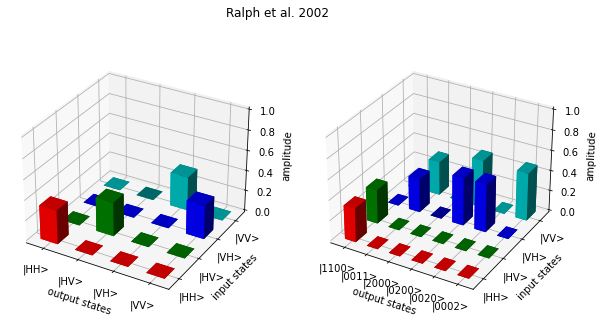

In [3]:
# input state:
initial_state = [(0,1,0,1,0,0),
                 (0,1,0,0,1,0),
                 (0,0,1,1,0,0),
                 (0,0,1,0,1,0)]

initial_state = FockBasis(initial_state, 3, 6)

# output state:
target_state =  [(0,1,0,1,0,0),
                 (0,1,0,0,1,0),
                 (0,0,1,0,1,0),
                 (0,0,1,1,0,0)]
# failed states:
fail_state = [(0,1,1,0,0,0),
              (0,0,0,1,1,0),
              (0,2,0,0,0,0),
              (0,0,2,0,0,0),
              (0,0,0,2,0,0),
              (0,0,0,0,2,0)]

Ralph2002 = sf.Program(6)

with Ralph2002.context as q:
    Ket(initial_state)              | q
    
    # CNOT Prototcol:
    Rgate(np.pi)                    | q[3]          # B3 nu = 1/2, phase change upon refelction on top
    BSgate(np.pi/4, np.pi)          | (q[3], q[4])
    BSgate(np.arccos(np.sqrt(1/3))) | (q[0], q[1])  # B1 nu = 1/3
    BSgate(np.arccos(np.sqrt(1/3))) | (q[2], q[3])  # B2 nu = 1/3
    BSgate(np.arccos(np.sqrt(1/3))) | (q[4], q[5])  # B5 nu = 1/3
    Rgate(np.pi)                    | q[3]          # B4 nu = 1/2, phase change upon refelction on top
    BSgate(np.pi/4, np.pi)          | (q[3], q[4])
    

evaluate(Ralph2002, target_state, fail_state, title='Ralph et al. 2002')

 21%|████████████████████████████▎                                                                                                        | 2125/10000 [14:05<52:12,  2.51it/s, Cost=0.0018, Mean overlap=0.111]


Rgate(-0.11) | (q[0])
Rgate(-0.5096) | (q[1])
Rgate(1.293) | (q[2])
Rgate(0.04836) | (q[3])
Rgate(-0.4785) | (q[4])
Rgate(0.0455) | (q[5])
MZgate(-0.04897, 0.1751) | (q[0], q[1])
MZgate(-0.7849, 1.336) | (q[2], q[3])
MZgate(1.84, -0.4083) | (q[4], q[5])
MZgate(2.972, 0.3841) | (q[1], q[2])
MZgate(-2.927, -0.6111) | (q[3], q[4])
MZgate(0.09376, -0.7523) | (q[0], q[1])
MZgate(0.7445, -0.5123) | (q[2], q[3])
MZgate(-1.87, 3.072) | (q[4], q[5])
MZgate(-0.04621, -0.1818) | (q[1], q[2])
MZgate(1.53, -0.33) | (q[3], q[4])
MZgate(-1.201, -0.6851) | (q[0], q[1])
MZgate(-1.232, -0.1653) | (q[2], q[3])
MZgate(1.198, 0.842) | (q[4], q[5])
MZgate(0.1432, -0.5947) | (q[1], q[2])
MZgate(1.564, -1.071) | (q[3], q[4])

1. Input:

The norm of the ket is  0.9999998

The nonzero components are:
(0.001-0j) (0, 0, 0, 0, 0, 2)
(0.304+0.136j) (0, 0, 0, 0, 1, 1)
(0.429-0.197j) (0, 0, 0, 0, 2, 0)
(0.301+0.136j) (0, 0, 0, 1, 0, 1)
(0.3-0.138j) (0, 0, 0, 1, 1, 0)
(-0.002-0j) (0, 0, 0, 2, 0, 0)
(-0.002-0.001j) (0,

C:\Users\marti\Documents\Universität\Masterthesises\CompSci - PhotonicQC\QuantumGateSynthesis\Prometheus_Backup\QGS.py:370: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


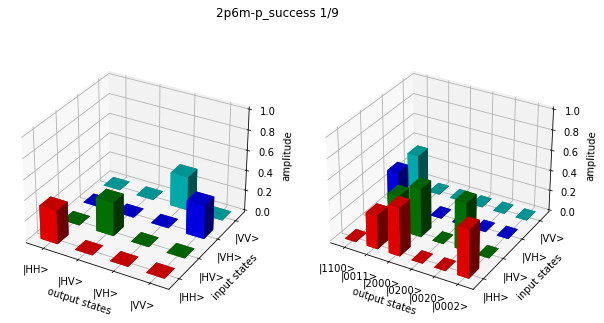

In [5]:
qgs = QGS(2, initial_state, modes = 6)
qgs.fit(target_state, reps = 10000, p_success = 1/9)
qgs.evaluate(target_state, fail_state, title='2p6m-p_success 1/9')
qgs.save('2p6m_ps1o9')

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [1:01:58<00:00,  2.69it/s, Cost=0.00055, Mean overlap=0.111]


Rgate(-0.11) | (q[0])
Rgate(-0.45) | (q[1])
Rgate(1.347) | (q[2])
Rgate(0.0707) | (q[3])
Rgate(-0.3838) | (q[4])
Rgate(0.0455) | (q[5])
MZgate(-0.03876, 0.1751) | (q[0], q[1])
MZgate(-0.962, 1.39) | (q[2], q[3])
MZgate(1.528, -0.3136) | (q[4], q[5])
MZgate(3.139, 2.466) | (q[1], q[2])
MZgate(-3.144, -0.5392) | (q[3], q[4])
MZgate(-0.03869, -0.6962) | (q[0], q[1])
MZgate(0.9564, -0.5392) | (q[2], q[3])
MZgate(-1.535, 3.147) | (q[4], q[5])
MZgate(-0.003257, -0.09737) | (q[1], q[2])
MZgate(1.568, -0.2319) | (q[3], q[4])
MZgate(-1.233, -0.1135) | (q[0], q[1])
MZgate(-1.234, -0.138) | (q[2], q[3])
MZgate(1.227, 0.5266) | (q[4], q[5])
MZgate(-0.002819, -0.4734) | (q[1], q[2])
MZgate(1.568, -1.384) | (q[3], q[4])

1. Input:

The norm of the ket is  1.0

The nonzero components are:
(0.331+0.05j) (0, 0, 0, 0, 1, 1)
(0.379-0.28j) (0, 0, 0, 0, 2, 0)
(0.33+0.05j) (0, 0, 0, 1, 0, 1)
(0.267-0.197j) (0, 0, 0, 1, 1, 0)
(-0.001-0j) (0, 0, 1, 0, 0, 1)
(-0+0.001j) (0, 0, 1, 0, 1, 0)
(0.001+0.001j) (0, 0,

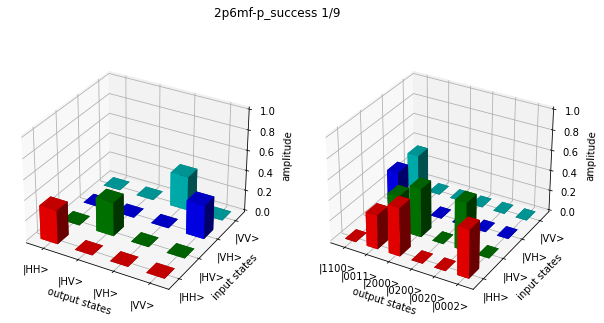

In [6]:
qgs.fit(target_state, fail_state, reps = 10000, p_success = 1/9)
qgs.evaluate(target_state, fail_state, title='2p6mf-p_success 1/9')
qgs.save('2p6mf_ps1o9')

## Liu and Wei 2022

In [ ]:
# input state:
initial_state = [(1,0,1,0,1,0),
                 (1,0,1,0,0,1),
                 (0,1,1,0,1,0),
                 (0,1,1,0,0,1)]

initial_state = FockBasis(initial_state, 4, 6)

# output state:
target_state =  [(1,0,1,0,1,0),
                 (1,0,1,0,0,1),
                 (0,1,1,0,0,1),
                 (0,1,1,0,1,0)]
# failed states:
fail_state = [(1,1,1,0,0,0),
              (0,0,1,0,1,1),
              (2,0,1,0,0,0),
              (0,2,1,0,0,0),
              (0,0,1,0,2,0),
              (0,0,1,0,0,2)]

LiuWei2022 = sf.Program(6)

with LiuWei2022.context as q:
    Ket(initial_state)  | q
    
    # Prepare Ancilla in the state 1/sqrt(2) (|H> + |V>)
    BSgate().H          | (q[2], q[3])
    Rgate(np.pi)        | q[3]    
    
    # Hadarmad Gate
    BSgate()            | (q[4], q[5])
    Rgate(np.pi)        | q[5]
    
    # CZ Protocoll
    Interferometer(PBS) | (q[0], q[2])  # PBS1 transmitt H refelect V
    BSgate().H          | (q[2], q[3])  # HWP1 @ 22.5°
    Rgate(np.pi)        | q[3]
    Interferometer(PBS) | (q[2], q[4])  # PBS2 transmitt H reflect V
    BSgate().H          | (q[2], q[3])  # HWP2 @ 22.5°
    Rgate(np.pi)        | q[3]
    
    # Hadarmad Gate
    BSgate()            | (q[4], q[5])
    Rgate(np.pi)        | q[5]

evaluate(LiuWei2022, target_state, fail_state, cutoff_dim=4, title = 'Liu and Wei 2022')

### Feedforward Operation

In [ ]:
# output state:
target_state =  [(1,0,0,1,1,0),
                 (1,0,0,1,0,1),
                 (0,1,0,1,0,1),
                 (0,1,0,1,1,0)]
# failed states:
fail_state = [(1,1,0,1,0,0),
              (0,0,0,1,1,1),
              (2,0,0,1,0,0),
              (0,2,0,1,0,0),
              (0,0,0,1,2,0),
              (0,0,0,1,0,2)]

LiuWei2022 = sf.Program(6)

with LiuWei2022.context as q:
    Ket(initial_state)  | q
    
    # Prepare Ancilla in the state 1/sqrt(2) (|H> + |V>)
    BSgate().H          | (q[2], q[3])
    Rgate(np.pi)        | q[3]    
    
    # Hadarmad Gate
    BSgate()            | (q[4], q[5])
    Rgate(np.pi)        | q[5]
    
    # CZ Protocoll
    Interferometer(PBS) | (q[0], q[2])  # PBS1 transmitt H refelect V
    BSgate().H          | (q[2], q[3])  # HWP1 @ 22.5°
    Rgate(np.pi)        | q[3]
    Interferometer(PBS) | (q[2], q[4])  # PBS2 transmitt H reflect V
    BSgate().H          | (q[2], q[3])  # HWP2 @ 22.5°
    Rgate(np.pi)        | q[3]
    Rgate(np.pi)        | q[5]          # Feedforward correction
    
    # Hadarmad Gate
    BSgate()            | (q[4], q[5])
    Rgate(np.pi)        | q[5]

evaluate(LiuWei2022, target_state, fail_state, cutoff_dim=4, title='Liu and Wei 2022 - Feedforward')

## 3 Photon on 6 Modes

 25%|██████████████████████████████▊                                                                                              | 20/81 [2:48:02<8:06:46, 478.79s/it, Sweep=0.07, Cost=0.0929, Overlap=0.0399]C:\Users\marti\Documents\Universität\Masterthesises\CompSci - PhotonicQC\QuantumGateSynthesis\Prometheus_Backup\QGS.py:886: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\marti\Documents\Universität\Masterthesises\CompSci - PhotonicQC\QuantumGateSynthesis\Prometheus_Backup\QGS.py:309: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
100%|█

Minimal of the cost function:  0.037617817521095276
at a success probability of:  0.013000000000000001


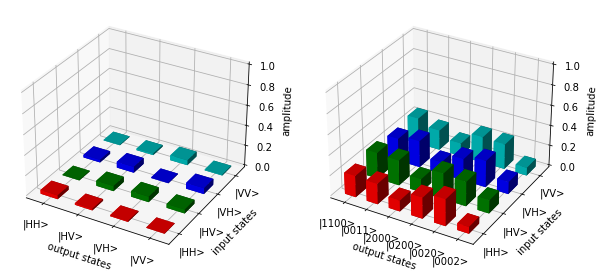

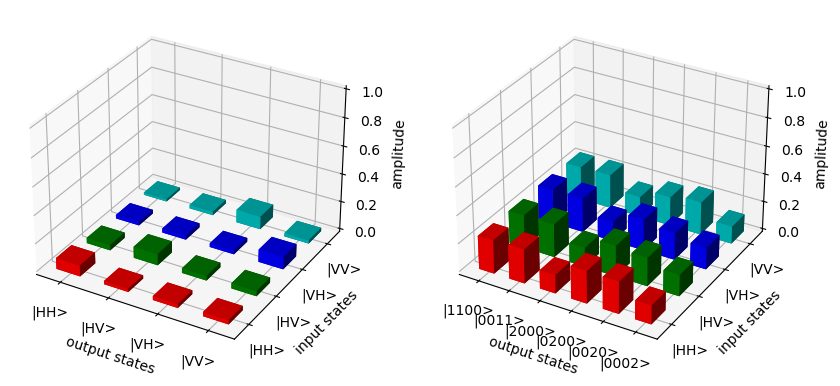

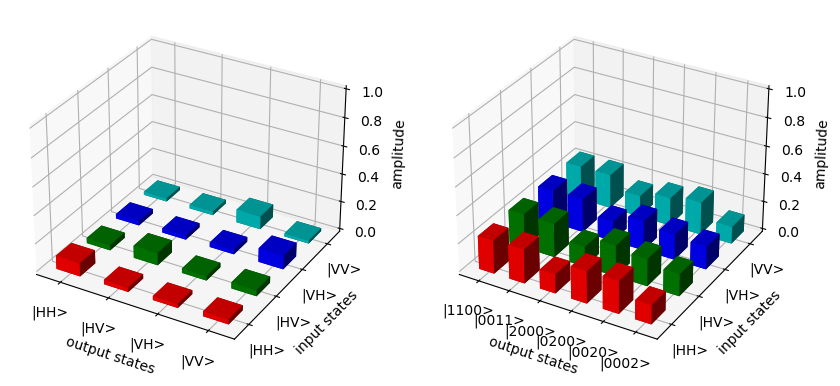

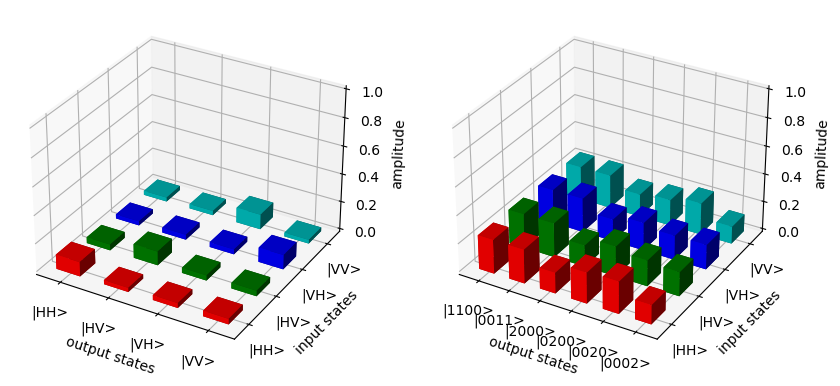

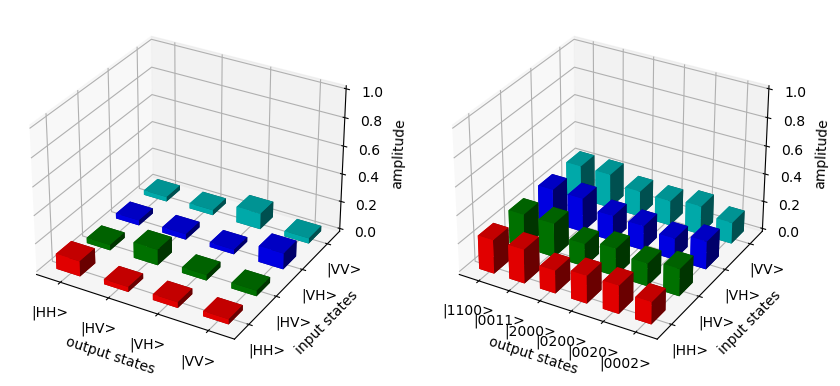

...

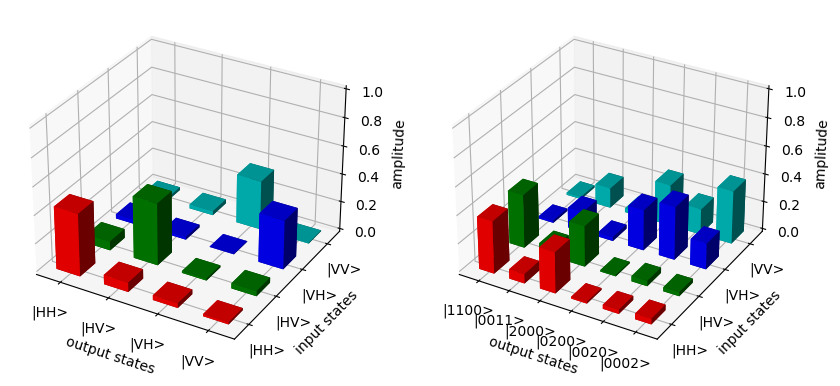

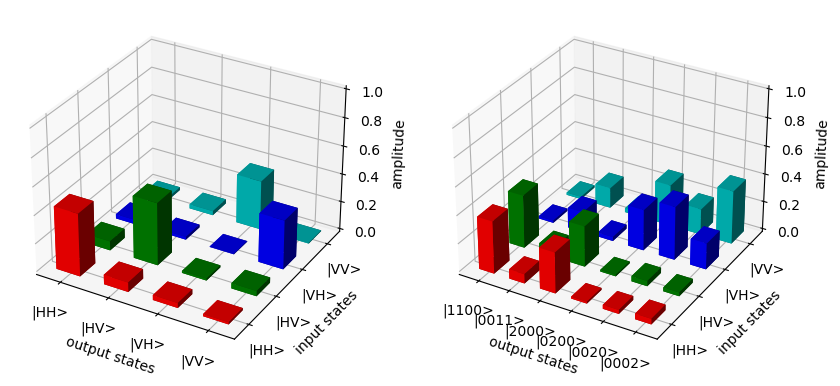

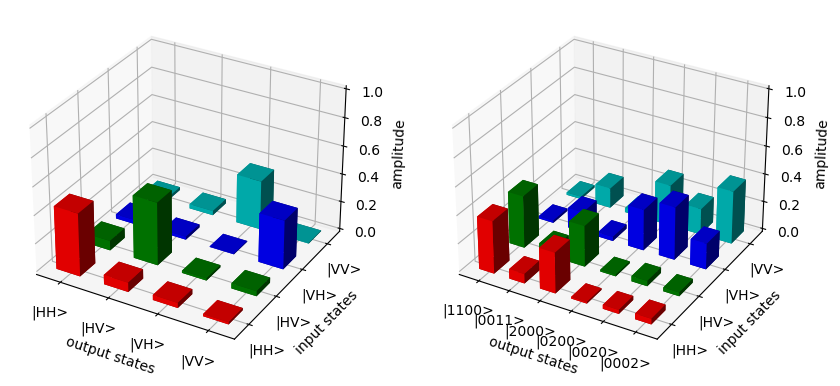

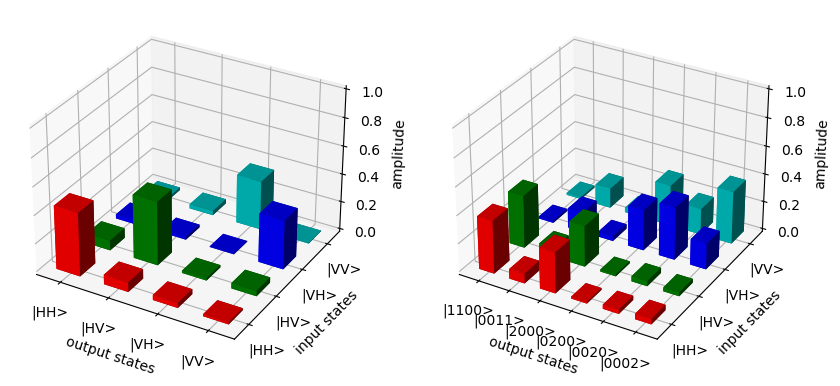

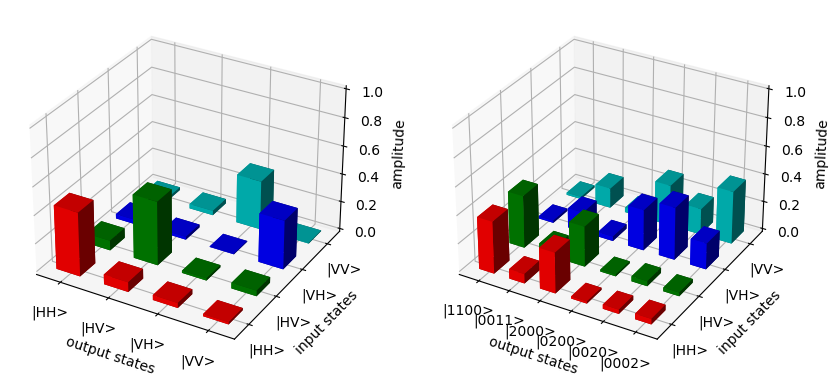

In [3]:
# input state:
initial_state = [(1,0,1,0,1,0),
                 (1,0,0,1,1,0),
                 (0,1,1,0,1,0),
                 (0,1,0,1,1,0)]

# output state:
target_state =  [(1,0,1,0),
                 (1,0,0,1),
                 (0,1,0,1),
                 (0,1,1,0)]

# failed states:
fail_state = [(1,1,0,0),
              (0,0,1,1),
              (2,0,0,0),
              (0,2,0,0),
              (0,0,2,0),
              (0,0,0,2)]

qgs = QGS(3, initial_state, layers=1, decomposition='Reck', modes=6)
qgs.fit(target_state, fail_states = fail_state, reps = 1000, n_sweeps=81, path = '3p6m', sweep_low = 0.01, sweep_high = 0.25)

## 6 Photon on 9 Modes
enough for EPR generation (4 photons on 5 modes) and the use of it on the CNOT operatrion

In [4]:
# input state:
initial_state = [(1,0,1,0,1,1,1,0,1),
                 (1,0,0,1,1,1,1,0,1),
                 (0,1,1,0,1,1,1,0,1),
                 (0,1,0,1,1,1,1,0,1)]

# output state:
target_state =  [(1,0,1,0),
                 (1,0,0,1),
                 (0,1,0,1),
                 (0,1,1,0)]

# failed states:
fail_state = [(1,1,0,0),
              (0,0,1,1),
              (2,0,0,0),
              (0,2,0,0),
              (0,0,2,0),
              (0,0,0,2)]

qgs = QGS(4, initial_state, layers=1, decomposition='Reck', modes=9)
qgs.fit(target_state, fail_states = fail_state, reps = 1000, n_sweeps=39, path = '6p9m', sweep_low = 0.01, sweep_high = 0.124)

  0%|                                                                                                                                                                                  | 0/39 [2:30:17<?, ?it/s]

KeyboardInterrupt

